In [37]:
import librosa
from ipywidgets import Audio
import IPython.display
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
import numpy as np
import scipy
import matplotlib.pyplot as plt
import soundfile as sf
import torch
from tqdm.notebook import tqdm
from functools import partial

from gfm_iaif import gfm_iaif
from utils import h1h2, weighted_log_mag_mse_loss
from tract_proxy import VocalTractProxy
from optimize import TractControlsOptimizer
from glottis import Glottis

# from dask.distributed import LocalCluster

In [38]:
output_notebook()

Loading BokehJS ...

In [39]:
# input, fs = librosa.load("C#2.wav")
# Audio.from_file("C#2.wav", loop=False)
input, fs = librosa.load("0_47.wav")
Audio.from_file("0_47.wav", loop=False)

Audio(value=b'RIFF2\xd7\n\x00WAVEfmt \x12\x00\x00\x00\x03\x00\x01\x00\x80\xbb\x00\x00\x00\xee\x02\x00\x04\x00 …

In [40]:
framelength = 1024
hoplength = 128
fmin, fmax = 70, 500
ncilinders = 44

In [41]:
frames = librosa.util.frame(input, frame_length=framelength, hop_length=hoplength)
nframes = frames.shape[1]

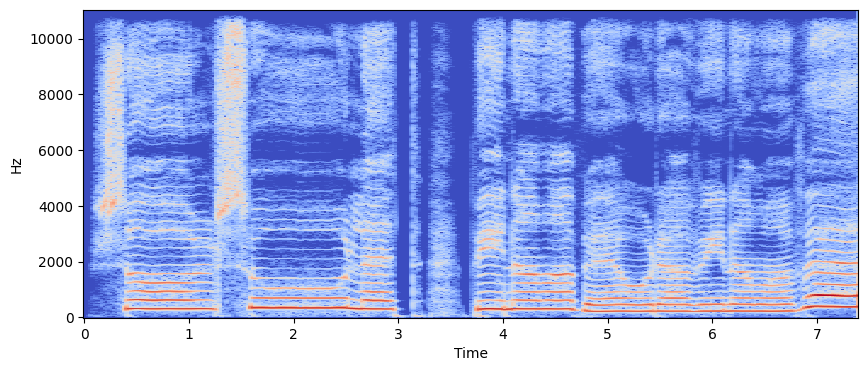

In [42]:
X = librosa.amplitude_to_db(np.abs(librosa.stft(input, n_fft=framelength))).squeeze()
plt.figure(figsize=(10,4))
librosa.display.specshow(X, sr=fs, x_axis="time", y_axis="hz")

In [43]:
f0 = np.concatenate([librosa.yin(frames[:,i] / np.max(np.abs(frames[:,i])), fmin=fmin, fmax=fmax, frame_length=framelength, hop_length=hoplength, sr=fs, center=False, trough_threshold=0.1) for i in range(nframes)])
plot = figure(title="Estimated f0", x_axis_label="Frame", y_axis_label="Frequency (Hz)", width=800, height=400)
plot.line(np.arange(f0.size), f0)
show(plot)

### Inverse filtering with GFM-IAIF

In [81]:
glottis = np.zeros_like(input)
vtcoeffs = np.empty((ncilinders+1,nframes))
glcoeffs = np.empty((4, nframes))
lipcoeffs = np.empty((2, nframes))

for i in range(nframes):
    frame = frames[:, i]
    vtcoeffs[:,i], glcoeffs[:,i], lipcoeffs[:,i] = gfm_iaif(frame, n_vt=ncilinders)
    framepad = np.pad(frame, ((0,ncilinders+1)), mode='edge')
    idx = np.arange(librosa.frames_to_samples(i, hop_length=hoplength), librosa.frames_to_samples(i, hop_length=hoplength)+framelength)
    glottis[idx] += scipy.signal.lfilter(vtcoeffs[:,i], [1], framepad)[ncilinders+1:] * scipy.signal.get_window("hamming", framelength)

IPython.display.Audio(data=glottis.T.flatten(), rate=fs)

In [82]:
plot = figure(title="Frequency response of vocal tract", width=800, height=400, x_axis_label="Frequency (Hz)", y_axis_label="Magnitude (dB)")
freqresp = np.empty((framelength//2, nframes), dtype=np.complex64)
for i in range(nframes):
    w, freqresp[:,i] = scipy.signal.freqz([1], vtcoeffs[:,i], plot=lambda w, h: plot.line(w, 20. * np.log10(np.abs(h)), alpha=0.05), fs=fs)
    w, freqresp[:,i] = scipy.signal.freqz(vtcoeffs[:,i], [1], plot=lambda w, h: plot.line(w, 20. * np.log10(np.abs(h)), alpha=0.05, color="red"), fs=fs)
show(plot)

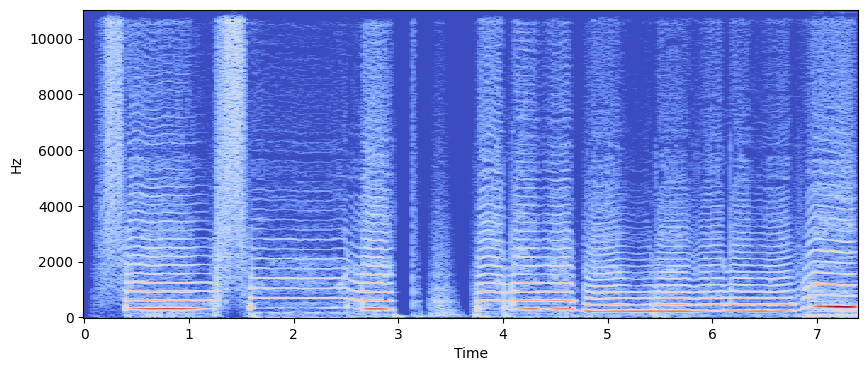

In [83]:
X = librosa.amplitude_to_db(np.abs(librosa.stft(glottis, n_fft=framelength))).squeeze()
plt.figure(figsize=(10,4))
librosa.display.specshow(X, sr=fs, x_axis="time", y_axis="hz")

### Tenseness & Loudness

In [84]:
gframes = librosa.util.frame(glottis, frame_length=framelength, hop_length=hoplength)

In [85]:
# Rd = torch.tensor((h1h2(gframes, f0, sr=fs) + 7.6) / 11.1)
Rd = np.empty(nframes)

for i in range(nframes):
    X = librosa.amplitude_to_db(np.abs(librosa.stft(gframes[:,i], n_fft=framelength, hop_length=framelength)))
    h1bin = int(np.round(f0[i] / fs * framelength))
    h2bin = int(np.round(2 * f0[i] / fs * framelength))
    Rd[i] = (X[h1bin,1] - X[h2bin,1] + 7.6) / 11.
    gframes[:,i]

In [86]:
tenseness = np.clip(1 - Rd / 3, 0, 1)
plot = figure(title="Tenseness", width=800, height=400, x_axis_label="Frame")
plot.line(np.arange(nframes), tenseness)
show(plot)

In [97]:
loudness = librosa.feature.rms(y=input, frame_length=framelength, hop_length=hoplength)
plot = figure(title="Loudness", width=800, height=400, x_axis_label="Frame")
plot.line(np.arange(nframes), librosa.amplitude_to_db(loudness.T.flatten()))
show(plot)

In [106]:
glottis = Glottis(ncilinders, fs)
glottis_signal = glottis.get_waveform(tenseness=torch.Tensor(tenseness), freq=torch.Tensor(f0.reshape(-1, 1)), frame_len=hoplength).detach().numpy()
gframes = librosa.util.frame(glottis_signal, frame_length=framelength, hop_length=hoplength).copy()

for i in range(gframes.shape[1]):
    idx = np.arange(librosa.frames_to_samples(i, hop_length=hoplength), librosa.frames_to_samples(i, hop_length=hoplength)+framelength)
    glottis_signal[idx] *= (loudness[0,0] + 10**(15/20))

IPython.display.Audio(data=glottis_signal, rate=fs)

## Curve fitting

In [107]:
gframes = librosa.util.frame(glottis_signal, frame_length=framelength, hop_length=hoplength)

In [ ]:
# plot = figure(title="Frequency Response of the Fitted Vocal Tract", width=800, height=400, x_axis_label="Frequency (Hz)", y_axis_label="Magnitude (dB)")

# vt = VocalTractProxy(framelength // 2)

# # damp glottis-lips stationary wave
# vt.r0 = 0.1
# vt.rl = -0.85
# vt.tl = 1 + vt.rl

# vtopt = TractControlsOptimizer(vt)
# Hkl = np.empty((framelength // 2, nframes), dtype=np.complex64)


# # for i in tqdm(range(nframes)):
# for i in tqdm(range(nframes)):
#     target = torch.tensor(freqresp[:,i], dtype=torch.complex64)

#     vtopt.optimize(target, loss_fn=partial(weighted_log_mag_mse_loss, sr=fs), n_iters=20)

#     Hkl[:,i] = vtopt.get_prediction().detach().numpy()

#     plot.line(np.linspace(0, fs // 2, Hkl[:,i].size), librosa.amplitude_to_db(np.abs(freqresp[:,i])), alpha=0.05, color="red")
#     plot.line(np.linspace(0, fs // 2, Hkl[:,i].size), librosa.amplitude_to_db(np.abs(Hkl[:,i])), alpha=0.05)

# show(plot)

In [ ]:
# out = np.zeros_like(input)

# for i in tqdm(range(min(nframes, gframes.shape[1]))):
#     frame = gframes[:, i]
#     framepad = np.pad(frame, ((0,ncilinders+1)), mode='edge')
#     idx = np.arange(librosa.frames_to_samples(i, hop_length=hoplength), librosa.frames_to_samples(i, hop_length=hoplength)+framelength)
#     out[idx] += np.fft.irfft(np.fft.rfft(frame * scipy.signal.get_window("hamming", framelength))[0:-1] * Hkl[:,i], n=framelength)

# out = np.nan_to_num(out, nan=0.0)

# IPython.display.Audio(data=out, rate=fs)

In [105]:
out = np.zeros_like(input)

for i in tqdm(range(min(nframes, gframes.shape[1]))):
    frame = gframes[:, i]
    framepad = np.pad(frame, ((0,ncilinders+1)), mode='edge')
    idx = np.arange(librosa.frames_to_samples(i, hop_length=hoplength), librosa.frames_to_samples(i, hop_length=hoplength)+framelength)
    # out[idx] += np.fft.irfft(np.fft.rfft(frame * scipy.signal.get_window("hamming", framelength))[0:-1] * Hkl[:,i], n=framelength)
    out[idx] += scipy.signal.lfilter([1], vtcoeffs[:,i], framepad)[ncilinders+1:] * scipy.signal.get_window("hamming", framelength)

out = np.nan_to_num(out, nan=0.0)

IPython.display.Audio(data=out, rate=fs)

  0%|          | 0/622 [00:00<?, ?it/s]

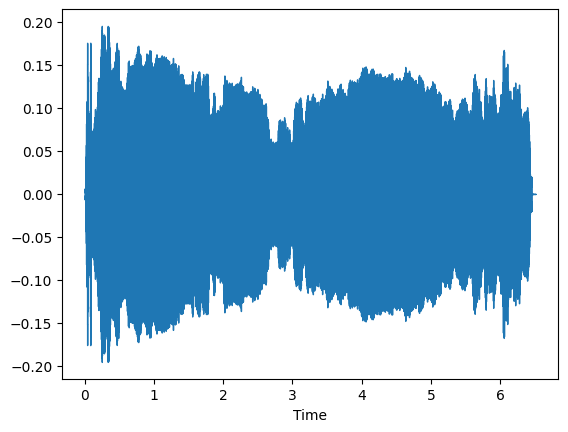

In [18]:
librosa.display.waveshow(out)

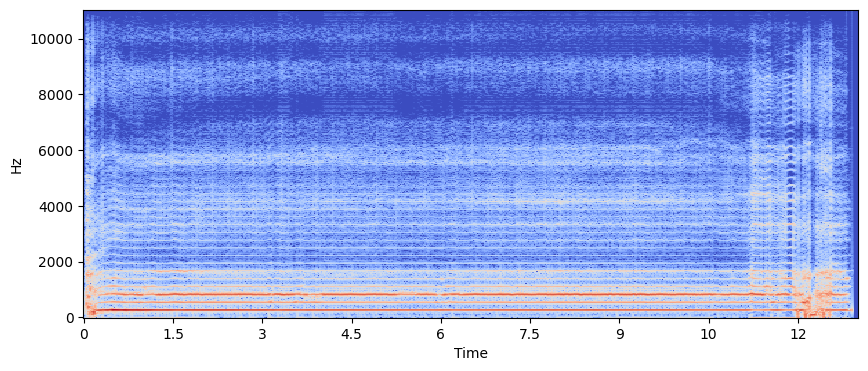

In [20]:
X = librosa.amplitude_to_db(np.abs(librosa.stft(out, n_fft=framelength))).squeeze()
plt.figure(figsize=(10,4))
librosa.display.specshow(X, sr=fs, x_axis="time", y_axis="hz")